In [1]:
import pandas as pd

file_path = r"D:\airbnb-project\data\listings.csv" # Change E: to your pen drive's letter
df = pd.read_csv(file_path)
df.head()


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [2]:
# Shape of dataset (rows, columns)
print("Shape:", df.shape)

# Column names
print("\nColumn Names:")
print(df.columns)

# Data types and non-null counts
print("\nInfo:")
print(df.info())

# Check missing values
print("\nMissing Values:")
print(df.isnull().sum())

# Quick statistical summary (only for numeric columns)
print("\nSummary Statistics:")
print(df.describe())

Shape: (3818, 92)

Column Names:
Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url',
       'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', '

In [3]:
# Remove duplicate rows
df.drop_duplicates(inplace=True)

# Fill missing values (example: replace NaN in reviews_per_month with 0)
if 'reviews_per_month' in df.columns:
    df['reviews_per_month'] = df['reviews_per_month'].fillna(0)

# Drop rows where essential fields like price or name are missing
essential_cols = ['name', 'price']
df.dropna(subset=essential_cols, inplace=True)

# Reset index after cleaning
df.reset_index(drop=True, inplace=True)

print("Data cleaned. New shape:", df.shape)


Data cleaned. New shape: (3818, 92)


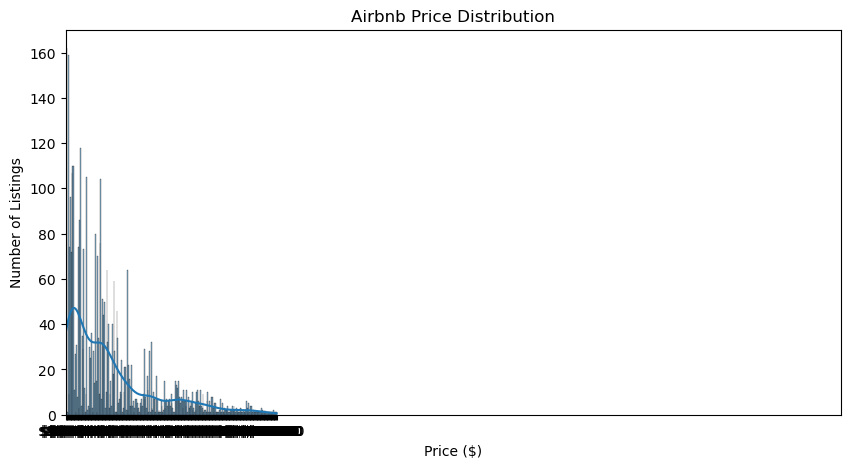

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,5))
sns.histplot(df['price'], bins=100, kde=True)
plt.xlim(0, 1000)  # cap extreme prices for clarity
plt.title("Airbnb Price Distribution")
plt.xlabel("Price ($)")
plt.ylabel("Number of Listings")
plt.show()

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\1686366061.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_neigh.values, y=top_neigh.index, palette="viridis")


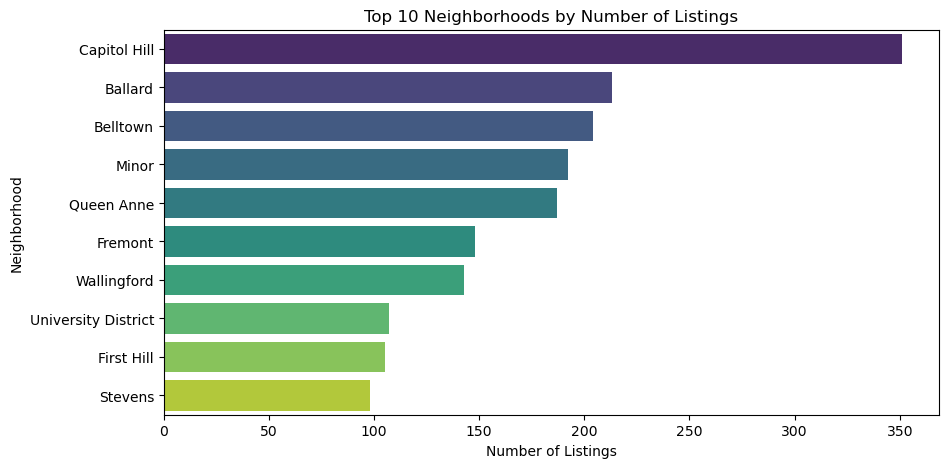

In [5]:
plt.figure(figsize=(10,5))
top_neigh = df['neighbourhood'].value_counts().head(10)
sns.barplot(x=top_neigh.values, y=top_neigh.index, palette="viridis")
plt.title("Top 10 Neighborhoods by Number of Listings")
plt.xlabel("Number of Listings")
plt.ylabel("Neighborhood")
plt.show()


In [7]:
import numpy as np

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\3439111291.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='room_type', y='price', data=df, estimator=np.mean, palette="coolwarm")


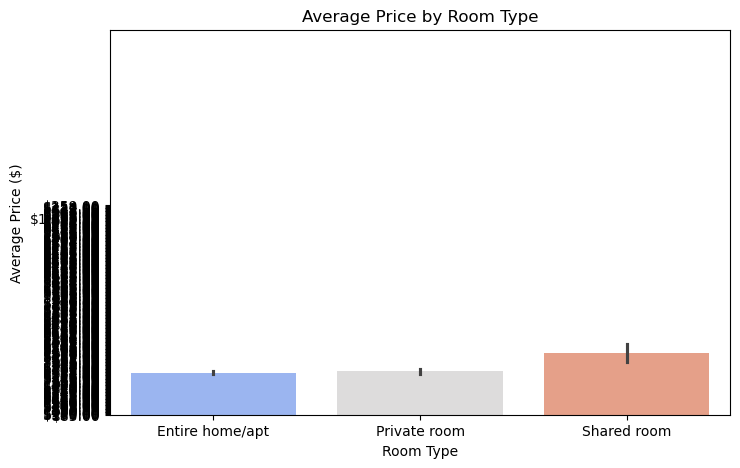

In [8]:
plt.figure(figsize=(8,5))
sns.barplot(x='room_type', y='price', data=df, estimator=np.mean, palette="coolwarm")
plt.ylim(0, 500)  # focus on realistic range
plt.title("Average Price by Room Type")
plt.xlabel("Room Type")
plt.ylabel("Average Price ($)")
plt.show()

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\2498441576.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_hosts.values, y=top_hosts.index, palette="mako")


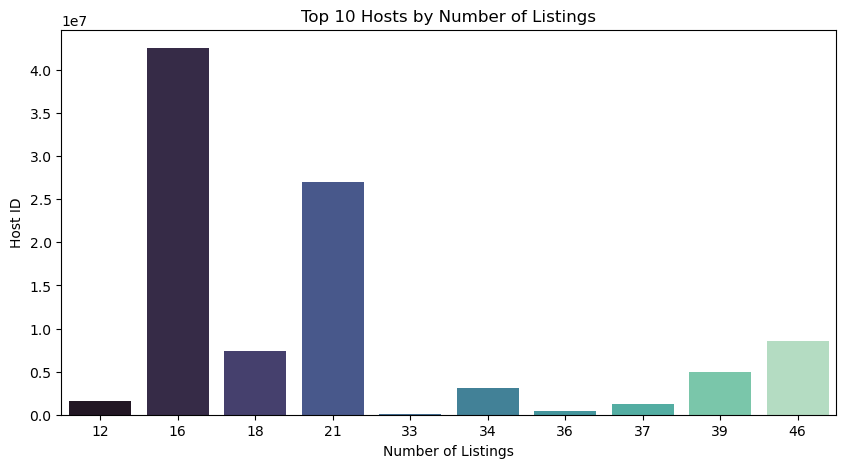

In [9]:
top_hosts = df['host_id'].value_counts().head(10)

plt.figure(figsize=(10,5))
sns.barplot(x=top_hosts.values, y=top_hosts.index, palette="mako")
plt.title("Top 10 Hosts by Number of Listings")
plt.xlabel("Number of Listings")
plt.ylabel("Host ID")
plt.show()

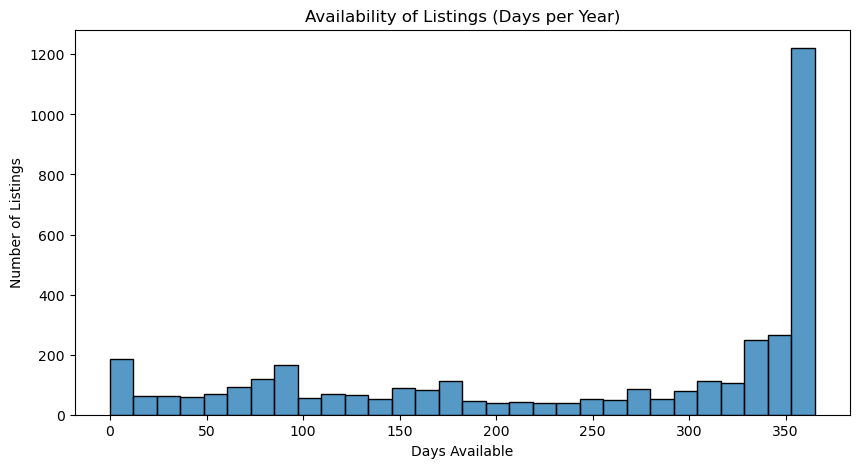

In [10]:
plt.figure(figsize=(10,5))
sns.histplot(df['availability_365'], bins=30, kde=False)
plt.title("Availability of Listings (Days per Year)")
plt.xlabel("Days Available")
plt.ylabel("Number of Listings")
plt.show()

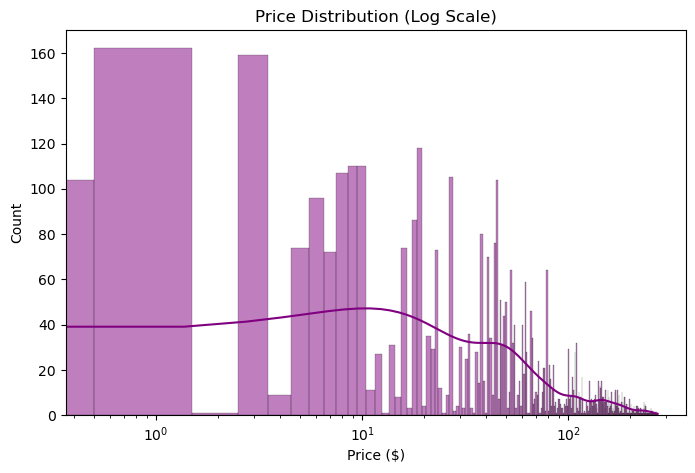

In [11]:
plt.figure(figsize=(8,5))
sns.histplot(df['price'], bins=100, kde=True, color='purple')
plt.xscale('log')
plt.title("Price Distribution (Log Scale)")
plt.xlabel("Price ($)")
plt.ylabel("Count")
plt.show()

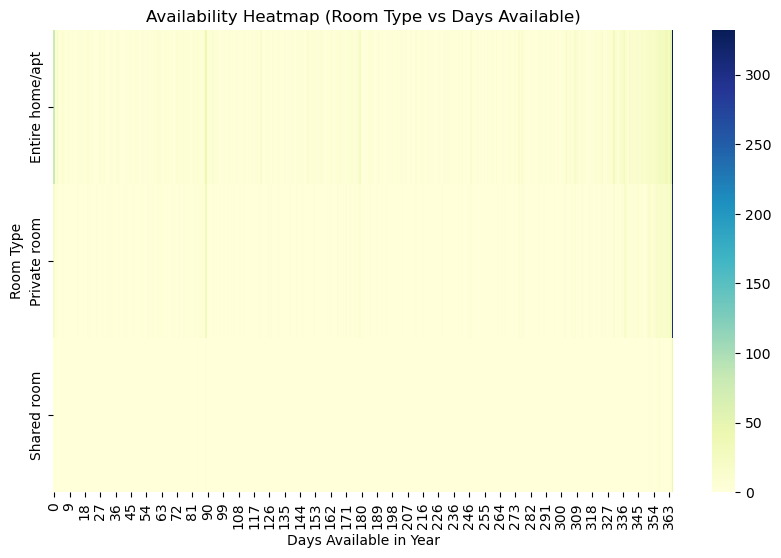

In [12]:
availability = df.groupby(['room_type', 'availability_365']).size().unstack(fill_value=0)
plt.figure(figsize=(10,6))
sns.heatmap(availability, cmap="YlGnBu", cbar=True)
plt.title("Availability Heatmap (Room Type vs Days Available)")
plt.xlabel("Days Available in Year")
plt.ylabel("Room Type")
plt.show()

In [14]:
!pip install folium


   -------------------- ------------------- 1/2 [folium]
   -------------------- ------------------- 1/2 [folium]
   ---------------------------------------- 2/2 [folium]



In [15]:
import folium

# Create a base map
map_airbnb = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=12)

# Add points
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(map_airbnb)

map_airbnb

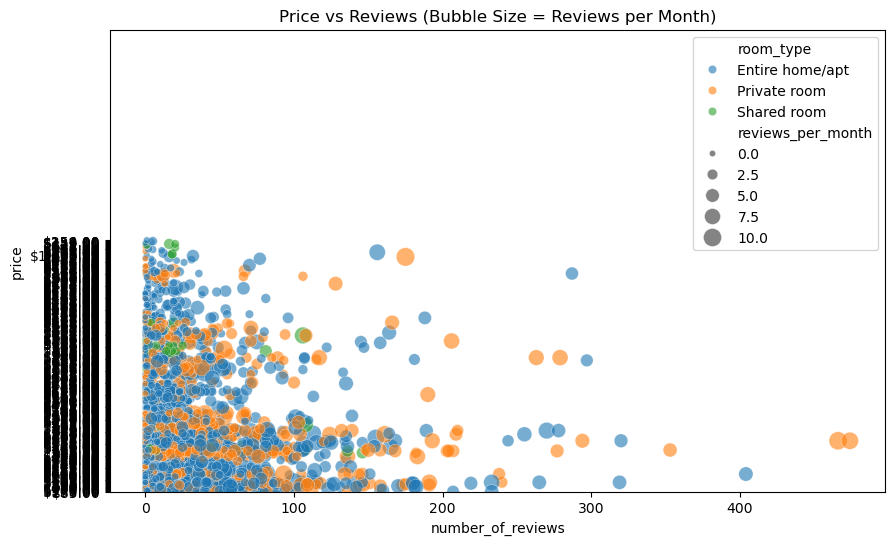

In [16]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x='number_of_reviews',
    y='price',
    size='reviews_per_month',
    hue='room_type',
    data=df,
    alpha=0.6,
    sizes=(20, 200)
)
plt.ylim(0, 500)
plt.title("Price vs Reviews (Bubble Size = Reviews per Month)")
plt.show()

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\3954760948.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_neigh.index, y=top_neigh.values, palette="viridis")


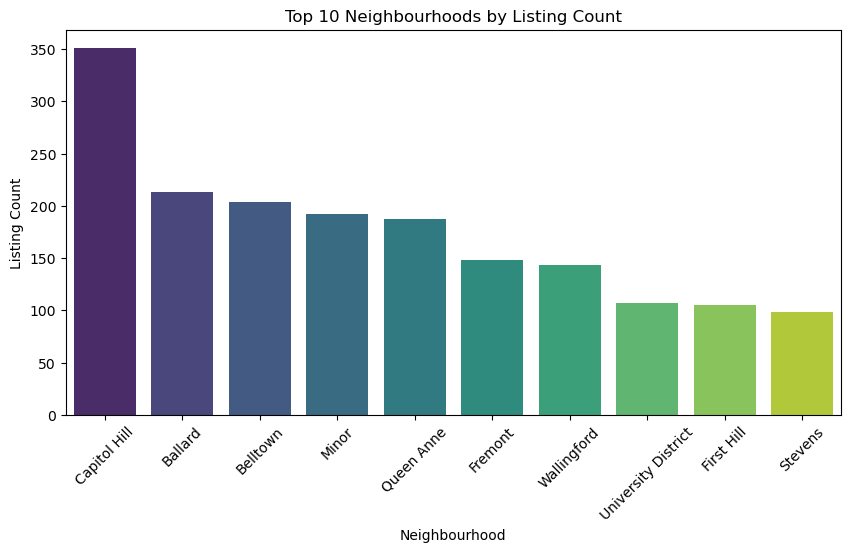

In [19]:
plt.figure(figsize=(10,6))
sns.barplot(
    x='neighbourhood_group', 
    y='price', 
    data=df, 
    estimator=lambda x: x.mean(), 
    palette="coolwarm"
)
plt.ylim(0, 500)
plt.title("Average Price by Neighbourhood Group")
plt.show()


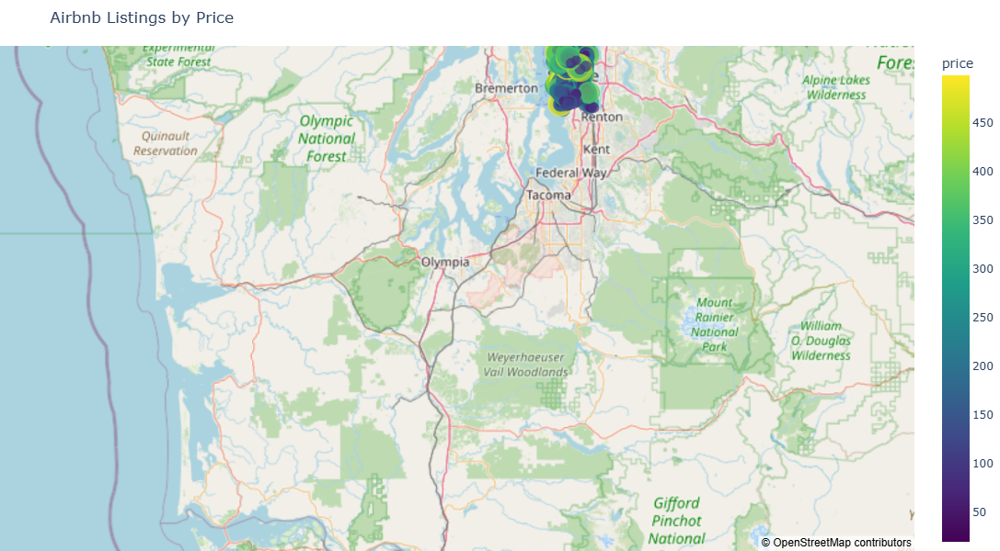

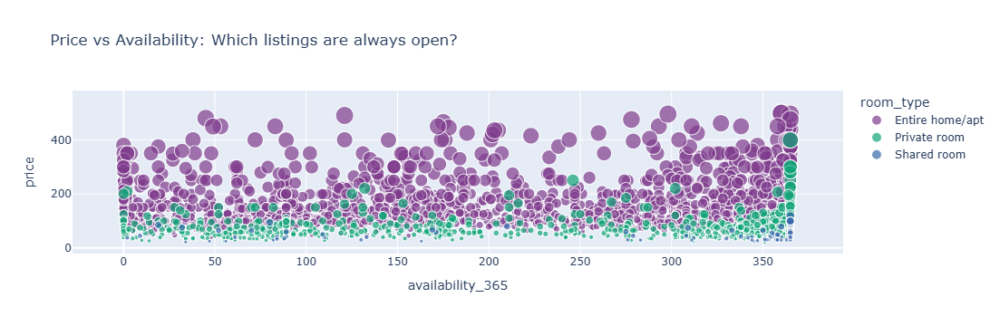

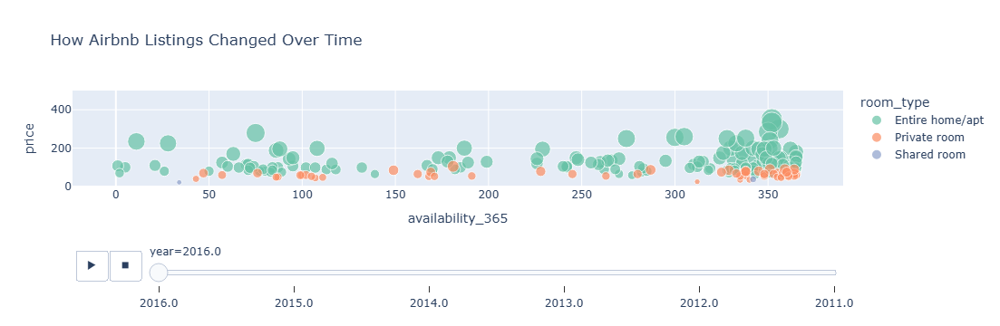

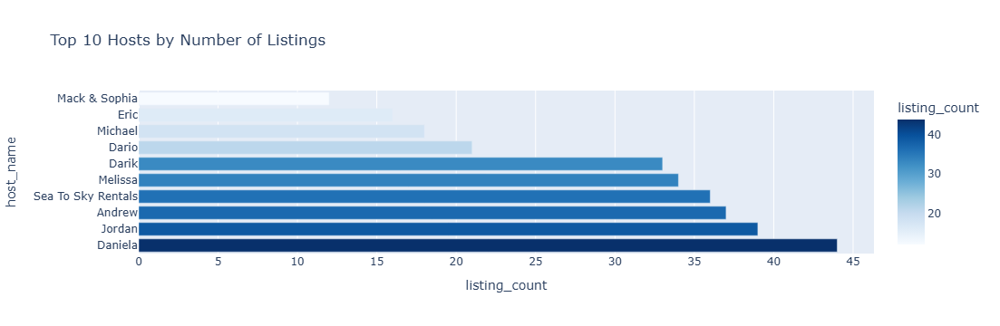

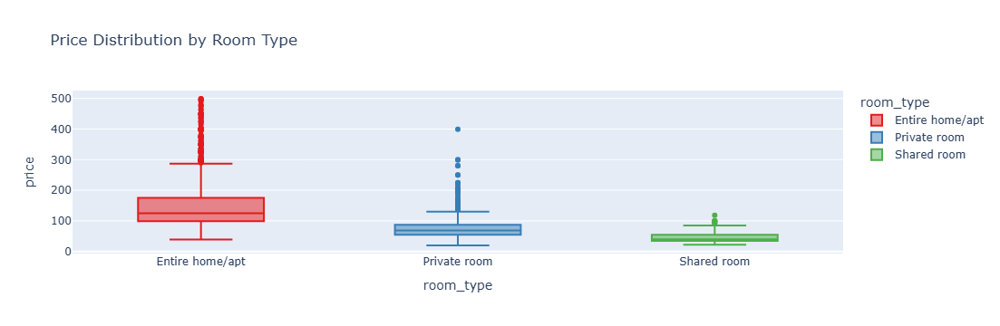

In [24]:
import pandas as pd
import plotly.express as px

# -----------------------
# 1. DATA LOADING & CLEANING
# -----------------------
# Change to your actual CSV file path
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# Convert price to numeric
df['price'] = (
    df['price']
    .astype(str)
    .str.replace("$", "", regex=False)
    .str.replace(",", "", regex=False)
)
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# Drop missing coordinates or prices
df = df.dropna(subset=['latitude', 'longitude', 'price'])
df = df[(df['latitude'].between(-90, 90)) & (df['longitude'].between(-180, 180))]

# Filter out extreme luxury listings for storytelling focus
df = df[df['price'] < 500]

# -----------------------
# 2. INTERACTIVE MAP
# -----------------------
fig_map = px.scatter_mapbox(
    df,
    lat="latitude",
    lon="longitude",
    color="price",
    size="price",
    hover_name="name" if 'name' in df.columns else None,
    hover_data=["neighbourhood", "room_type", "price"] if 'neighbourhood' in df.columns and 'room_type' in df.columns else None,
    zoom=11,
    height=600,
    title="Airbnb Listings by Price",
    color_continuous_scale=px.colors.sequential.Viridis
)

fig_map.update_layout(mapbox_style="open-street-map")
fig_map.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig_map.show()

# -----------------------
# 3. BUBBLE CHART: PRICE vs AVAILABILITY
# -----------------------
if 'availability_365' in df.columns:
    fig_bubble = px.scatter(
        df,
        x="availability_365",
        y="price",
        size="price",
        color="room_type" if 'room_type' in df.columns else None,
        hover_name="name" if 'name' in df.columns else None,
        title="Price vs Availability: Which listings are always open?",
        color_discrete_sequence=px.colors.qualitative.Bold
    )
    fig_bubble.show()

# -----------------------
# 4. ANIMATED STORY: PRICE TRENDS OVER TIME
# -----------------------
if 'last_review' in df.columns:
    df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')
    df['year'] = df['last_review'].dt.year

    fig_anim = px.scatter(
        df.dropna(subset=['year']),
        x="availability_365",
        y="price",
        animation_frame="year",
        size="price",
        color="room_type" if 'room_type' in df.columns else None,
        hover_name="name" if 'name' in df.columns else None,
        title="How Airbnb Listings Changed Over Time",
        range_y=[0, 500],
        color_discrete_sequence=px.colors.qualitative.Set2
    )
    fig_anim.show()

# -----------------------
# 5. BAR CHART: TOP HOSTS
# -----------------------
if 'host_id' in df.columns and 'host_name' in df.columns:
    top_hosts = df.groupby(['host_id', 'host_name']).size().reset_index(name='listing_count')
    top_hosts = top_hosts.sort_values(by='listing_count', ascending=False).head(10)

    fig_hosts = px.bar(
        top_hosts,
        x="listing_count",
        y="host_name",
        orientation='h',
        title="Top 10 Hosts by Number of Listings",
        color="listing_count",
        color_continuous_scale="Blues"
    )
    fig_hosts.show()

# -----------------------
# 6. BOX PLOT: PRICE DISTRIBUTION BY ROOM TYPE
# -----------------------
if 'room_type' in df.columns:
    fig_box = px.box(
        df,
        x="room_type",
        y="price",
        title="Price Distribution by Room Type",
        color="room_type",
        color_discrete_sequence=px.colors.qualitative.Set1
    )
    fig_box.show()

In [26]:
import plotly.express as px
import plotly.io as pio

# Example: Create a price distribution plot
fig = px.histogram(df, x='price', nbins=50, title='Price Distribution of Airbnb Listings')

# Save as HTML
pio.write_html(fig, file='airbnb_storytelling.html', auto_open=True)

In [34]:
import pandas as pd
import plotly.express as px

# Load dataset
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# Ensure price is numeric
df['price'] = pd.to_numeric(df['price'].astype(str).str.replace('$', '').str.replace(',', ''), errors='coerce')

# Filter for reasonable price range to avoid outliers
df_map = df[(df['price'] > 0) & (df['price'] < 500)]

# Create a cleaner map
fig = px.scatter_mapbox(
    df_map,
    lat="latitude",
    lon="longitude",
    color="price",
    size="price",
    hover_name="name",
    hover_data={"latitude": False, "longitude": False, "price": True, "room_type": True},
    color_continuous_scale=px.colors.sequential.Viridis,
    size_max=10,
    zoom=10,
    opacity=0.5
)

# Map styling
fig.update_layout(
    mapbox_style="carto-positron",
    margin={"r":0,"t":0,"l":0,"b":0},
    height=700
)

# Save HTML file
import plotly.io as pio
pio.write_html(fig, file=r"D:\airbnb-project\airbnb_storytelling_clean.html", auto_open=True)

In [35]:
import pandas as pd
import plotly.express as px

# Load dataset
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# Ensure price is numeric
df['price'] = pd.to_numeric(df['price'].astype(str).str.replace('$', '').str.replace(',', ''), errors='coerce')

# Filter for reasonable price range to avoid outliers
df_map = df[(df['price'] > 0) & (df['price'] < 500)]

# Create a clustered map
fig = px.scatter_mapbox(
    df_map,
    lat="latitude",
    lon="longitude",
    color="price",
    size="price",
    hover_name="name",
    hover_data={"latitude": False, "longitude": False, "price": True, "room_type": True},
    color_continuous_scale=px.colors.sequential.Viridis,
    size_max=10,
    zoom=10,
    opacity=0.5
)

# Enable clustering
fig.update_traces(cluster=dict(enabled=True))

# Map styling
fig.update_layout(
    mapbox_style="carto-positron",
    margin={"r":0,"t":0,"l":0,"b":0},
    height=700
)

# Save HTML file
import plotly.io as pio
pio.write_html(fig, file=r"D:\airbnb-project\airbnb_storytelling_clustered.html", auto_open=True)

In [40]:
import pandas as pd

reviews = pd.read_csv(r"D:\airbnb-project\data\reviews.csv")
print(reviews.columns)

Index(['listing_id', 'date'], dtype='object')


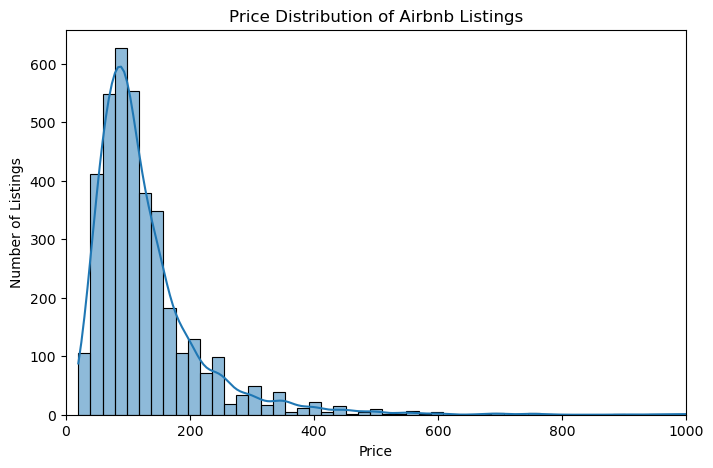

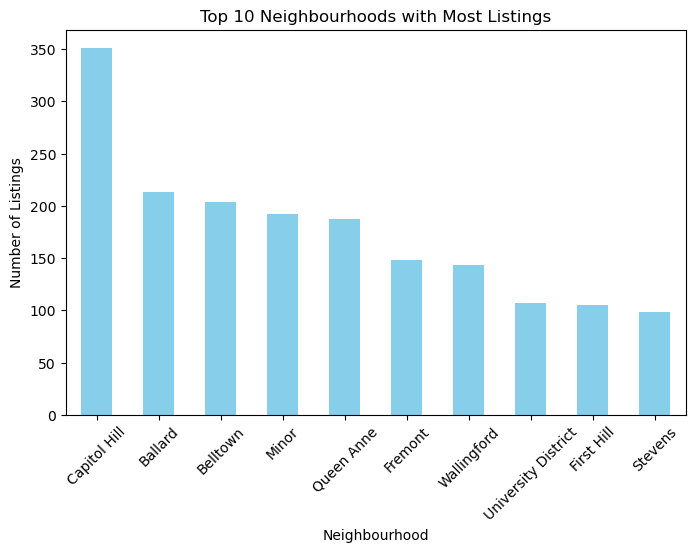

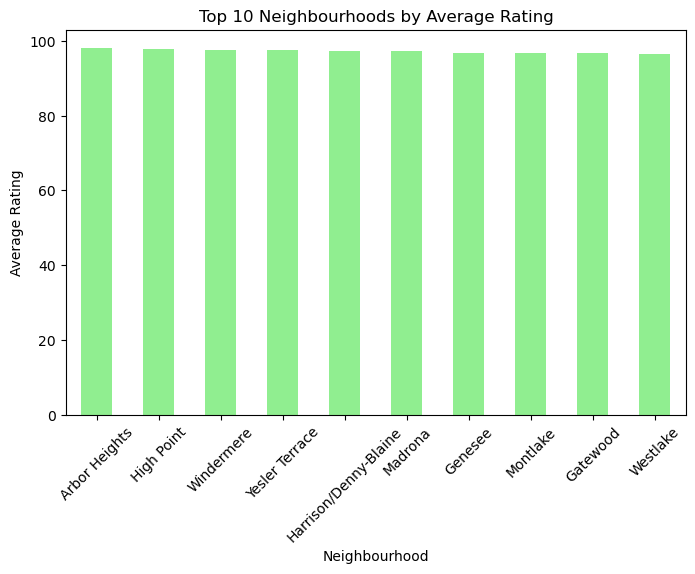

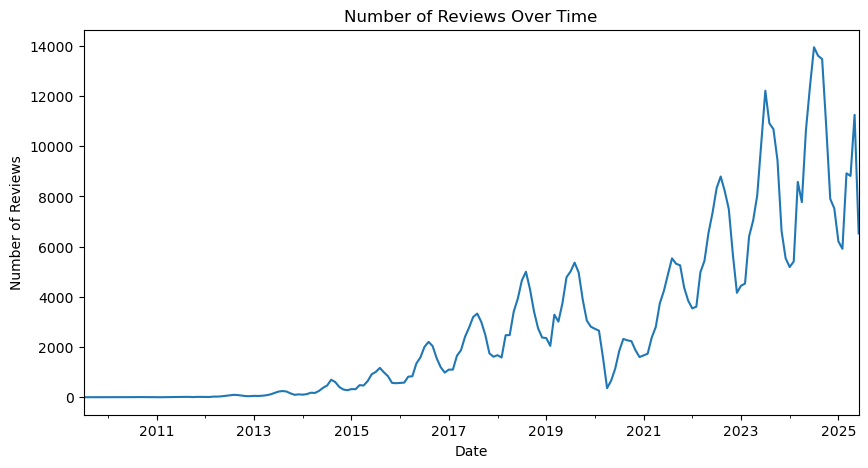

✅ Airbnb storytelling visuals generated successfully!


In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load datasets
listings = pd.read_csv(r"D:\airbnb-project\data\listings.csv")
reviews = pd.read_csv(r"D:\airbnb-project\data\reviews.csv")

# ---------- BASIC CLEANING ----------
# Convert prices to numeric if they exist
if 'price' in listings.columns:
    listings['price'] = (
        listings['price']
        .replace('[\$,]', '', regex=True)
        .astype(float)
    )

# Convert review dates
if 'date' in reviews.columns:
    reviews['date'] = pd.to_datetime(reviews['date'], errors='coerce')

# ---------- 1. DISTRIBUTION OF PRICES ----------
if 'price' in listings.columns:
    plt.figure(figsize=(8, 5))
    sns.histplot(listings['price'], bins=50, kde=True)
    plt.title('Price Distribution of Airbnb Listings')
    plt.xlabel('Price')
    plt.ylabel('Number of Listings')
    plt.xlim(0, 1000)  # focus on main range
    plt.show()

# ---------- 2. TOP NEIGHBOURHOODS ----------
if 'neighbourhood' in listings.columns:
    plt.figure(figsize=(8, 5))
    listings['neighbourhood'].value_counts().head(10).plot(kind='bar', color='skyblue')
    plt.title('Top 10 Neighbourhoods with Most Listings')
    plt.xlabel('Neighbourhood')
    plt.ylabel('Number of Listings')
    plt.xticks(rotation=45)
    plt.show()

# ---------- 3. AVERAGE RATING PER NEIGHBOURHOOD ----------
if 'review_scores_rating' in listings.columns and 'neighbourhood' in listings.columns:
    avg_ratings = listings.groupby('neighbourhood')['review_scores_rating'].mean().sort_values(ascending=False).head(10)
    plt.figure(figsize=(8, 5))
    avg_ratings.plot(kind='bar', color='lightgreen')
    plt.title('Top 10 Neighbourhoods by Average Rating')
    plt.xlabel('Neighbourhood')
    plt.ylabel('Average Rating')
    plt.xticks(rotation=45)
    plt.show()

# ---------- 4. REVIEWS OVER TIME ----------
if 'date' in reviews.columns:
    plt.figure(figsize=(10, 5))
    reviews.groupby(reviews['date'].dt.to_period('M')).size().plot()
    plt.title('Number of Reviews Over Time')
    plt.xlabel('Date')
    plt.ylabel('Number of Reviews')
    plt.show()

print("✅ Airbnb storytelling visuals generated successfully!")

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import base64
from io import BytesIO
from datetime import datetime

# File paths
listings_path = r"D:\airbnb-project\data\listings.csv"
reviews_path = r"D:\airbnb-project\data\reviews.csv"
output_html = r"D:\airbnb-project\airbnb_storytelling.html"

# Load datasets
listings = pd.read_csv(listings_path)
reviews = pd.read_csv(reviews_path)

# Basic cleaning
if 'price' in listings.columns:
    listings['price'] = listings['price'].replace('[\$,]', '', regex=True).astype(float)

if 'date' in reviews.columns:
    reviews['date'] = pd.to_datetime(reviews['date'], errors='coerce')

# Helper function to convert plots to base64 images
def fig_to_base64(fig):
    buffer = BytesIO()
    fig.savefig(buffer, format="png", bbox_inches="tight")
    buffer.seek(0)
    encoded = base64.b64encode(buffer.read()).decode('utf-8')
    plt.close(fig)
    return encoded

# Store chart images
charts = []

# 1. Price Distribution
if 'price' in listings.columns:
    fig, ax = plt.subplots(figsize=(8, 5))
    sns.histplot(listings['price'], bins=50, kde=True, ax=ax)
    ax.set_title('Price Distribution of Airbnb Listings')
    ax.set_xlabel('Price')
    ax.set_ylabel('Number of Listings')
    ax.set_xlim(0, 1000)
    charts.append(("Price Distribution", fig_to_base64(fig)))

# 2. Top Neighbourhoods
if 'neighbourhood' in listings.columns:
    fig, ax = plt.subplots(figsize=(8, 5))
    listings['neighbourhood'].value_counts().head(10).plot(kind='bar', color='skyblue', ax=ax)
    ax.set_title('Top 10 Neighbourhoods with Most Listings')
    ax.set_xlabel('Neighbourhood')
    ax.set_ylabel('Number of Listings')
    plt.xticks(rotation=45)
    charts.append(("Top 10 Neighbourhoods", fig_to_base64(fig)))

# 3. Average Ratings
if 'review_scores_rating' in listings.columns and 'neighbourhood' in listings.columns:
    avg_ratings = listings.groupby('neighbourhood')['review_scores_rating'].mean().sort_values(ascending=False).head(10)
    fig, ax = plt.subplots(figsize=(8, 5))
    avg_ratings.plot(kind='bar', color='lightgreen', ax=ax)
    ax.set_title('Top 10 Neighbourhoods by Average Rating')
    ax.set_xlabel('Neighbourhood')
    ax.set_ylabel('Average Rating')
    plt.xticks(rotation=45)
    charts.append(("Top 10 Neighbourhoods by Rating", fig_to_base64(fig)))

# 4. Reviews Over Time
if 'date' in reviews.columns:
    fig, ax = plt.subplots(figsize=(10, 5))
    reviews.groupby(reviews['date'].dt.to_period('M')).size().plot(ax=ax)
    ax.set_title('Number of Reviews Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Number of Reviews')
    charts.append(("Reviews Over Time", fig_to_base64(fig)))

# Generate HTML report
html_content = f"""
<html>
<head>
    <title>Airbnb Storytelling Report</title>
    <style>
        body {{
            font-family: Arial, sans-serif;
            background-color: #f4f6f8;
            padding: 20px;
        }}
        h1 {{
            text-align: center;
            color: #333;
        }}
        .chart {{
            margin-bottom: 50px;
            text-align: center;
            background: white;
            padding: 20px;
            border-radius: 10px;
            box-shadow: 0 2px 8px rgba(0,0,0,0.1);
        }}
        img {{
            max-width: 100%;
            height: auto;
            border-radius: 8px;
        }}
    </style>
</head>
<body>
    <h1>Airbnb Storytelling Report</h1>
    <p style="text-align:center;">Generated on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}</p>
"""

for title, img_data in charts:
    html_content += f"""
    <div class="chart">
        <h2>{title}</h2>
        <img src="data:image/png;base64,{img_data}" alt="{title}">
    </div>
    """

html_content += """
</body>
</html>
"""

# Save HTML file
with open(output_html, "w", encoding="utf-8") as f:
    f.write(html_content)

print(f"✅ Airbnb storytelling report saved at: {output_html}")

✅ Airbnb storytelling report saved at: D:\airbnb-project\airbnb_storytelling.html


In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import base64
from io import BytesIO
from datetime import datetime

# File paths
listings_path = r"D:\airbnb-project\data\listings.csv"
reviews_path = r"D:\airbnb-project\data\reviews.csv"
output_html = r"D:\airbnb-project\airbnb_storytelling.html"

# Load datasets
listings = pd.read_csv(listings_path)
reviews = pd.read_csv(reviews_path)

# Basic cleaning
if 'price' in listings.columns:
    listings['price'] = listings['price'].replace('[\$,]', '', regex=True).astype(float)

if 'date' in reviews.columns:
    reviews['date'] = pd.to_datetime(reviews['date'], errors='coerce')

# Helper function to convert plots to base64 images
def fig_to_base64(fig):
    buffer = BytesIO()
    fig.savefig(buffer, format="png", bbox_inches="tight")
    buffer.seek(0)
    encoded = base64.b64encode(buffer.read()).decode('utf-8')
    plt.close(fig)
    return encoded

# Narrative texts (edit to match your dataset or tone)
narratives = {
    "Price Distribution": (
        "This histogram shows the distribution of listing prices. "
        "Most listings fall within the lower-to-mid price range, with fewer high-end properties. "
        "Filtering out extreme outliers helps reveal typical guest costs."
    ),
    "Top 10 Neighbourhoods": (
        "These neighbourhoods contain the largest share of listings. "
        "High listing density often correlates with tourist attractions, transit access, or business districts."
    ),
    "Top 10 Neighbourhoods by Rating": (
        "Average ratings by neighbourhood reflect guest satisfaction across areas. "
        "Higher-rated neighbourhoods may indicate better location, cleanliness, or host responsiveness."
    ),
    "Reviews Over Time": (
        "This timeline shows how review volume changed over time. "
        "Spikes often align with peak travel seasons or local events, while troughs indicate quieter months."
    )
}

# Store chart images and titles
charts = []

# 1. Price Distribution
if 'price' in listings.columns:
    fig, ax = plt.subplots(figsize=(8, 5))
    sns.histplot(listings['price'].clip(upper=1000), bins=50, kde=True, ax=ax)
    ax.set_title('Price Distribution of Airbnb Listings')
    ax.set_xlabel('Price (USD)')
    ax.set_ylabel('Number of Listings')
    charts.append(("Price Distribution", narratives.get("Price Distribution", ""), fig_to_base64(fig)))

# 2. Top Neighbourhoods
if 'neighbourhood' in listings.columns:
    fig, ax = plt.subplots(figsize=(8, 5))
    listings['neighbourhood'].value_counts().head(10).plot(kind='bar', color='skyblue', ax=ax)
    ax.set_title('Top 10 Neighbourhoods with Most Listings')
    ax.set_xlabel('Neighbourhood')
    ax.set_ylabel('Number of Listings')
    plt.xticks(rotation=45)
    charts.append(("Top 10 Neighbourhoods", narratives.get("Top 10 Neighbourhoods", ""), fig_to_base64(fig)))

# 3. Average Ratings by Neighbourhood
if 'review_scores_rating' in listings.columns and 'neighbourhood' in listings.columns:
    avg_ratings = listings.groupby('neighbourhood')['review_scores_rating'].mean().sort_values(ascending=False).head(10)
    fig, ax = plt.subplots(figsize=(8, 5))
    avg_ratings.plot(kind='bar', color='lightgreen', ax=ax)
    ax.set_title('Top 10 Neighbourhoods by Average Rating')
    ax.set_xlabel('Neighbourhood')
    ax.set_ylabel('Average Rating')
    plt.xticks(rotation=45)
    charts.append(("Top 10 Neighbourhoods by Rating", narratives.get("Top 10 Neighbourhoods by Rating", ""), fig_to_base64(fig)))

# 4. Reviews Over Time
if 'date' in reviews.columns:
    fig, ax = plt.subplots(figsize=(10, 5))
    reviews.groupby(reviews['date'].dt.to_period('M')).size().plot(ax=ax)
    ax.set_title('Number of Reviews Over Time')
    ax.set_xlabel('Month')
    ax.set_ylabel('Number of Reviews')
    charts.append(("Reviews Over Time", narratives.get("Reviews Over Time", ""), fig_to_base64(fig)))

# Generate HTML with narratives
html_content = f"""
<html>
<head>
    <title>Airbnb Storytelling Report</title>
    <style>
        body {{ font-family: Arial, sans-serif; background-color: #f4f6f8; padding: 20px; }}
        h1 {{ text-align: center; color: #222; }}
        .meta {{ text-align:center; color:#555; margin-bottom:30px; }}
        .chart {{ margin-bottom: 40px; background: #fff; padding: 18px; border-radius: 10px; box-shadow: 0 2px 10px rgba(0,0,0,0.08); }}
        .chart h2 {{ margin-top: 0; color: #111; }}
        .narrative {{ color: #333; margin-bottom: 12px; line-height: 1.45; }}
        img {{ max-width: 100%; height: auto; border-radius: 6px; }}
    </style>
</head>
<body>
    <h1>Airbnb Storytelling Report</h1>
    <p class="meta">Generated on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}</p>
"""

for title, text, img_data in charts:
    html_content += f"""
    <div class="chart">
        <h2>{title}</h2>
        <p class="narrative">{text}</p>
        <img src="data:image/png;base64,{img_data}" alt="{title}">
    </div>
    """

html_content += """
</body>
</html>
"""

# Save HTML file
with open(output_html, "w", encoding="utf-8") as f:
    f.write(html_content)

print(f"✅ Storytelling report with narratives saved at: {output_html}")

✅ Storytelling report with narratives saved at: D:\airbnb-project\airbnb_storytelling.html


In [47]:
import sqlite3
import pandas as pd

# Create a connection to SQLite database file (creates one if it doesn't exist)
conn = sqlite3.connect("airbnb.db")

# Load CSVs into Pandas
listings_df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")
reviews_df = pd.read_csv(r"D:\airbnb-project\data\reviews.csv")

# Save DataFrames into SQL tables
listings_df.to_sql("listings", conn, if_exists="replace", index=False)
reviews_df.to_sql("reviews", conn, if_exists="replace", index=False)

print("Data loaded into SQL successfully!")

Data loaded into SQL successfully!


In [48]:
# Example query: Get top 10 most expensive listings
query = """
SELECT name, price, neighbourhood, room_type
FROM listings
ORDER BY price DESC
LIMIT 10;
"""

df_result = pd.read_sql_query(query, conn)
print(df_result)

                                  name    price neighbourhood        room_type
0        100% Walk Score 1-BR Downtown  $999.00      Belltown  Entire home/apt
1     Upper Queen Anne Craftsman House   $99.00    Queen Anne  Entire home/apt
2       Private Garden Suite, Bay View   $99.00    Queen Anne     Private room
3    Cozy Queen Anne Finished Basement   $99.00    Queen Anne     Private room
4   :: Carriage House :: Queen Anne ::   $99.00    Queen Anne  Entire home/apt
5  2 Bedrm Apt in the heart of Ballard   $99.00       Ballard  Entire home/apt
6             Sweet North Central Flat   $99.00       Ballard  Entire home/apt
7                   Sunny Ballard Digs   $99.00       Ballard  Entire home/apt
8                Vintage Ballard Charm   $99.00       Ballard  Entire home/apt
9                   View of Lake Union   $99.00    Queen Anne     Private room


In [52]:
import sqlite3
import pandas as pd

# Connect to SQLite database (creates airbnb.db in your project folder)
conn = sqlite3.connect(r"D:\airbnb-project\airbnb.db")

# Load CSV files into Pandas DataFrames
listings_df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")
reviews_df = pd.read_csv(r"D:\airbnb-project\data\reviews.csv")

# Save DataFrames as SQL tables
listings_df.to_sql("listings", conn, if_exists="replace", index=False)
reviews_df.to_sql("reviews", conn, if_exists="replace", index=False)

print("✅ Data successfully loaded into SQL database!")

✅ Data successfully loaded into SQL database!


In [53]:
# Example: Top 10 most expensive listings
query = """
SELECT name, price, neighbourhood, room_type
FROM listings
WHERE price IS NOT NULL
ORDER BY price DESC
LIMIT 10;
"""

df_result = pd.read_sql_query(query, conn)
print(df_result)

                                  name    price neighbourhood        room_type
0        100% Walk Score 1-BR Downtown  $999.00      Belltown  Entire home/apt
1     Upper Queen Anne Craftsman House   $99.00    Queen Anne  Entire home/apt
2       Private Garden Suite, Bay View   $99.00    Queen Anne     Private room
3    Cozy Queen Anne Finished Basement   $99.00    Queen Anne     Private room
4   :: Carriage House :: Queen Anne ::   $99.00    Queen Anne  Entire home/apt
5  2 Bedrm Apt in the heart of Ballard   $99.00       Ballard  Entire home/apt
6             Sweet North Central Flat   $99.00       Ballard  Entire home/apt
7                   Sunny Ballard Digs   $99.00       Ballard  Entire home/apt
8                Vintage Ballard Charm   $99.00       Ballard  Entire home/apt
9                   View of Lake Union   $99.00    Queen Anne     Private room


In [56]:
query = """
SELECT neighbourhood, ROUND(AVG(price), 2) AS avg_price
FROM listings
GROUP BY neighbourhood
ORDER BY avg_price DESC;
"""

pd.read_sql_query(query, conn)

,neighbourhood,avg_price
0,Yesler Terrace,0.0
1,Windermere,0.0
2,Westlake,0.0
3,Wedgewood,0.0
4,Wallingford,0.0
...,...,...
77,Ballard,0.0
78,Atlantic,0.0
79,Arbor Heights,0.0
80,Alki,0.0


In [58]:
query = """
SELECT host_id, host_name, COUNT(*) AS total_listings
FROM listings
GROUP BY host_id, host_name
ORDER BY total_listings DESC
LIMIT 10;
"""
pd.read_sql_query(query, conn)

,host_id,host_name,total_listings
0,8534462,Daniela,46
1,4962900,Jordan,39
2,1243056,Andrew,37
3,430709,Sea To Sky Rentals,36
4,3074414,Melissa,34
5,74305,Darik,33
6,26967583,Dario,21
7,7354306,Michael,18
8,42537846,Eric,16
9,658155,Joe,12


In [59]:
    query = """
SELECT room_type, COUNT(*) AS total_listings
FROM listings
GROUP BY room_type
ORDER BY total_listings DESC;
"""
pd.read_sql_query(query, conn)

,room_type,total_listings
0,Entire home/apt,2541
1,Private room,1160
2,Shared room,117


In [60]:
query = """
SELECT neighbourhood, ROUND(AVG(review_scores_rating), 2) AS avg_review_score
FROM listings
WHERE review_scores_rating IS NOT NULL
GROUP BY neighbourhood
ORDER BY avg_review_score DESC;
"""
pd.read_sql_query(query, conn)

,neighbourhood,avg_review_score
0,Arbor Heights,98.00
1,High Point,97.75
2,Windermere,97.50
3,Yesler Terrace,97.45
4,Harrison/Denny-Blaine,97.18
...,...,...
75,South Beacon Hill,89.50
76,View Ridge,88.20
77,South Park,88.00
78,University District,87.62


In [61]:
query = """
SELECT id, name, neighbourhood, price
FROM listings
WHERE price > 500
ORDER BY price DESC;
"""
pd.read_sql_query(query, conn)

,id,name,neighbourhood,price


In [62]:
query = """
SELECT id, name, number_of_reviews
FROM listings
ORDER BY number_of_reviews DESC
LIMIT 10;
"""
pd.read_sql_query(query, conn)

,id,name,number_of_reviews
0,208356,contemporary art loft downtown [7],474
1,365550,contemporary art loft downtown [17],466
2,25002,"Beautiful, Quiet, Friendly Ballard",404
3,47196,Capitol Hill Suite + Free Parking,353
4,63308,Guest Studio - North Capitol Hill,320
5,92835,"Charming Apt, VERY Central Location",319
6,5682,"Cozy Studio, min. to downtown -WiFi",297
7,279063,"Central Guest Room, Stunning View",294
8,53867,U District Backyard Cottage & Loft,287
9,841049,Volunteer Park Room 2,279


In [63]:
query = """
SELECT neighbourhood, ROUND(AVG(minimum_nights), 2) AS avg_min_nights
FROM listings
GROUP BY neighbourhood
ORDER BY avg_min_nights DESC;
"""
pd.read_sql_query(query, conn)

,neighbourhood,avg_min_nights
0,Riverview,5.25
1,Westlake,5.17
2,Capitol Hill,4.87
3,Harrison/Denny-Blaine,4.38
4,North College Park,4.00
...,...,...
77,Interbay,1.29
78,High Point,1.27
79,South Beacon Hill,1.00
80,Roxhill,1.00


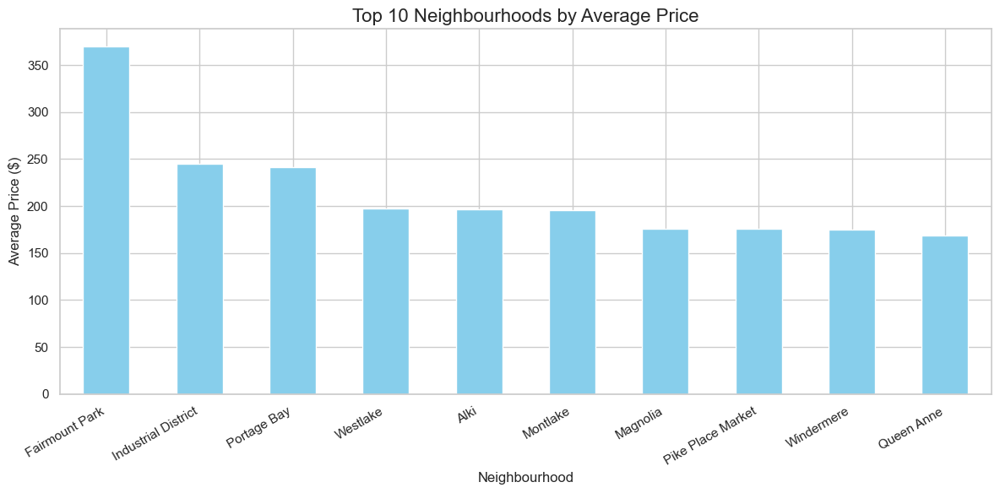

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\3465919423.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




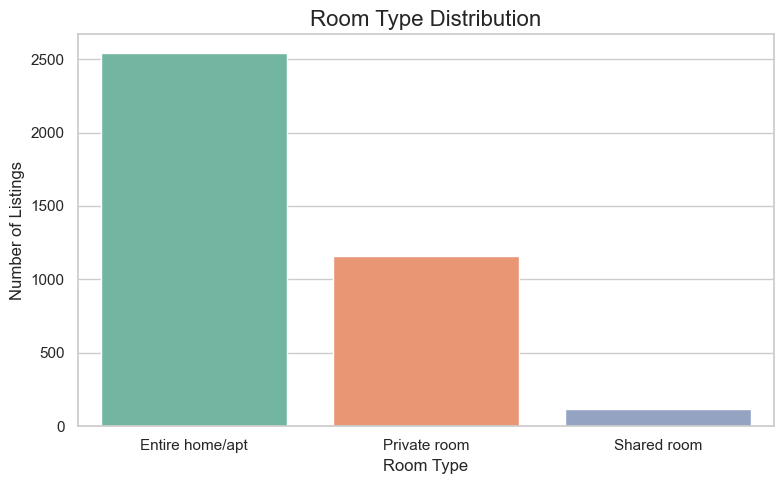

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\3465919423.py:41: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




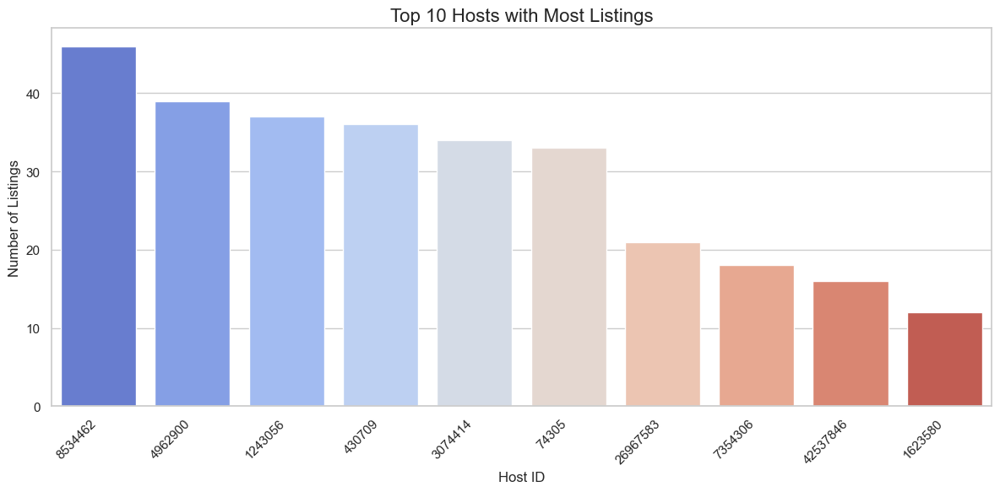

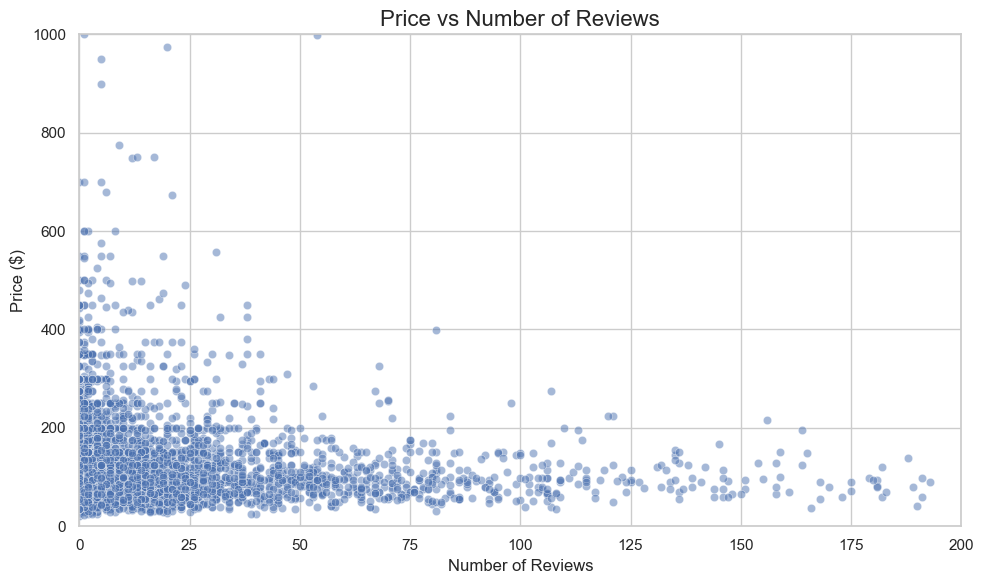

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\3465919423.py:63: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




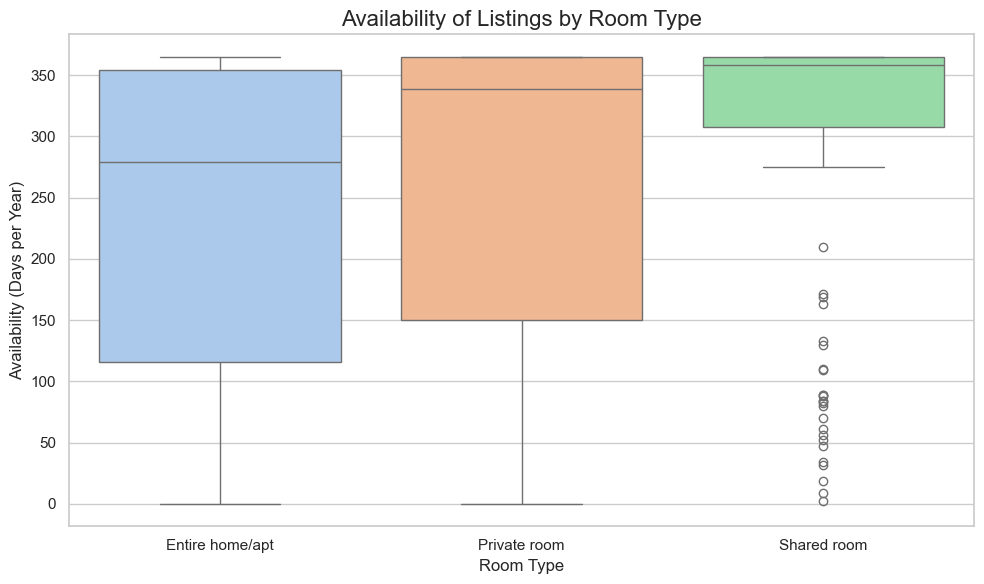

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the listings dataset
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# --- CLEAN PRICE COLUMN ---
df['price'] = (
    df['price']
    .replace('[\$,]', '', regex=True)  # remove $ and commas
    .astype(float)  # convert to numeric
)

# --- 1. Top 10 Neighbourhoods by Average Price ---
plt.figure(figsize=(12,6))
top10_neighbourhoods = df.groupby('neighbourhood')['price'].mean().sort_values(ascending=False).head(10)
top10_neighbourhoods.plot(kind='bar', color='skyblue')

plt.title('Top 10 Neighbourhoods by Average Price', fontsize=16)
plt.xlabel('Neighbourhood', fontsize=12)
plt.ylabel('Average Price ($)', fontsize=12)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()

# --- 2. Distribution of Room Types ---
plt.figure(figsize=(8,5))
room_counts = df['room_type'].value_counts()
sns.barplot(x=room_counts.index, y=room_counts.values, palette='Set2')

plt.title('Room Type Distribution', fontsize=16)
plt.xlabel('Room Type', fontsize=12)
plt.ylabel('Number of Listings', fontsize=12)
plt.tight_layout()
plt.show()

# --- 3. Top 10 Hosts with Most Listings ---
plt.figure(figsize=(12,6))
top10_hosts = df['host_id'].value_counts().head(10)
sns.barplot(x=top10_hosts.index.astype(str), y=top10_hosts.values, palette='coolwarm')

plt.title('Top 10 Hosts with Most Listings', fontsize=16)
plt.xlabel('Host ID', fontsize=12)
plt.ylabel('Number of Listings', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# --- 4. Price vs. Number of Reviews (Scatter) ---
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='number_of_reviews', y='price', alpha=0.5)
plt.xlim(0, 200)  # limit to avoid extreme outliers
plt.ylim(0, 1000)
plt.title('Price vs Number of Reviews', fontsize=16)
plt.xlabel('Number of Reviews', fontsize=12)
plt.ylabel('Price ($)', fontsize=12)
plt.tight_layout()
plt.show()

# --- 5. Availability by Room Type ---
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='room_type', y='availability_365', palette='pastel')

plt.title('Availability of Listings by Room Type', fontsize=16)
plt.xlabel('Room Type', fontsize=12)
plt.ylabel('Availability (Days per Year)', fontsize=12)
plt.tight_layout()
plt.show()

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Load dataset
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# Clean price column
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)

# Create folder for images
img_dir = "dashboard_images"
os.makedirs(img_dir, exist_ok=True)

# --- 1. Top 10 Neighbourhoods by Average Price ---
plt.figure(figsize=(12,6))
top10_neighbourhoods = df.groupby('neighbourhood')['price'].mean().sort_values(ascending=False).head(10)
top10_neighbourhoods.plot(kind='bar', color='skyblue')
plt.title('Top 10 Neighbourhoods by Average Price', fontsize=16)
plt.xlabel('Neighbourhood')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.savefig(f"{img_dir}/top_neighbourhoods.png")
plt.close()

# --- 2. Room Type Distribution ---
plt.figure(figsize=(8,5))
room_counts = df['room_type'].value_counts()
sns.barplot(x=room_counts.index, y=room_counts.values, palette='Set2')
plt.title('Room Type Distribution', fontsize=16)
plt.xlabel('Room Type')
plt.ylabel('Number of Listings')
plt.tight_layout()
plt.savefig(f"{img_dir}/room_type_distribution.png")
plt.close()

# --- 3. Top 10 Hosts with Most Listings ---
plt.figure(figsize=(12,6))
top10_hosts = df['host_id'].value_counts().head(10)
sns.barplot(x=top10_hosts.index.astype(str), y=top10_hosts.values, palette='coolwarm')
plt.title('Top 10 Hosts with Most Listings', fontsize=16)
plt.xlabel('Host ID')
plt.ylabel('Number of Listings')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(f"{img_dir}/top_hosts.png")
plt.close()

# --- 4. Price vs Number of Reviews ---
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='number_of_reviews', y='price', alpha=0.5)
plt.xlim(0, 200)
plt.ylim(0, 1000)
plt.title('Price vs Number of Reviews', fontsize=16)
plt.xlabel('Number of Reviews')
plt.ylabel('Price ($)')
plt.tight_layout()
plt.savefig(f"{img_dir}/price_vs_reviews.png")
plt.close()

# --- 5. Availability by Room Type ---
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='room_type', y='availability_365', palette='pastel')
plt.title('Availability of Listings by Room Type', fontsize=16)
plt.xlabel('Room Type')
plt.ylabel('Availability (Days per Year)')
plt.tight_layout()
plt.savefig(f"{img_dir}/availability.png")
plt.close()

# --- Create HTML Dashboard ---
html_content = """
<html>
<head>
<title>Airbnb Storytelling Dashboard</title>
<style>
body { font-family: Arial, sans-serif; background: #f4f4f4; padding: 20px; }
h1 { text-align: center; }
.chart { margin: 30px auto; text-align: center; background: white; padding: 15px; border-radius: 10px; width: 80%; box-shadow: 0 0 10px rgba(0,0,0,0.1); }
.chart img { max-width: 100%; height: auto; }
</style>
</head>
<body>

<h1>Airbnb Storytelling Dashboard</h1>
<div class='chart'>
<h2>Top 10 Neighbourhoods by Average Price</h2>
<img src='dashboard_images/top_neighbourhoods.png'>
</div>

<div class='chart'>
<h2>Room Type Distribution</h2>
<img src='dashboard_images/room_type_distribution.png'>
</div>

<div class='chart'>
<h2>Top 10 Hosts with Most Listings</h2>
<img src='dashboard_images/top_hosts.png'>
</div>

<div class='chart'>
<h2>Price vs Number of Reviews</h2>
<img src='dashboard_images/price_vs_reviews.png'>
</div>

<div class='chart'>
<h2>Availability of Listings by Room Type</h2>
<img src='dashboard_images/availability.png'>
</div>

</body>
</html>
"""

with open("airbnb_dashboard.html", "w", encoding="utf-8") as f:
    f.write(html_content)

print("✅ Dashboard generated: airbnb_dashboard.html")

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\814160549.py:31: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\814160549.py:42: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\814160549.py:65: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




✅ Dashboard generated: airbnb_dashboard.html


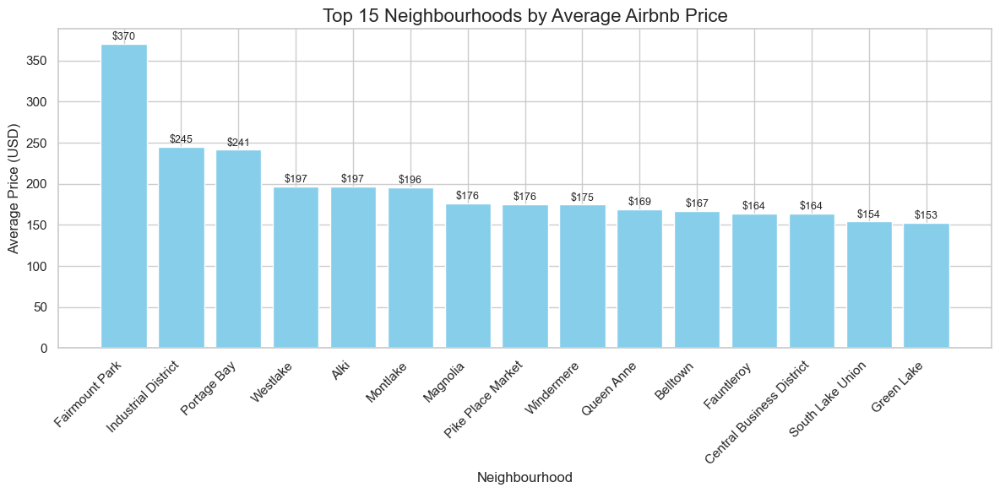

In [68]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# Clean the price column
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)

# Calculate average price per neighbourhood
avg_price = df.groupby('neighbourhood')['price'].mean().round(2).sort_values(ascending=False)

# Take top 15
top_n = avg_price.head(15)

# Plot
plt.figure(figsize=(12, 6))
bars = plt.bar(top_n.index, top_n.values, color='skyblue')

# Title and labels
plt.title("Top 15 Neighbourhoods by Average Airbnb Price", fontsize=16)
plt.xlabel("Neighbourhood", fontsize=12)
plt.ylabel("Average Price (USD)", fontsize=12)

# Rotate labels for readability
plt.xticks(rotation=45, ha='right')

# Add data labels
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
             f"${bar.get_height():,.0f}", ha='center', fontsize=9)

plt.tight_layout()
plt.show()

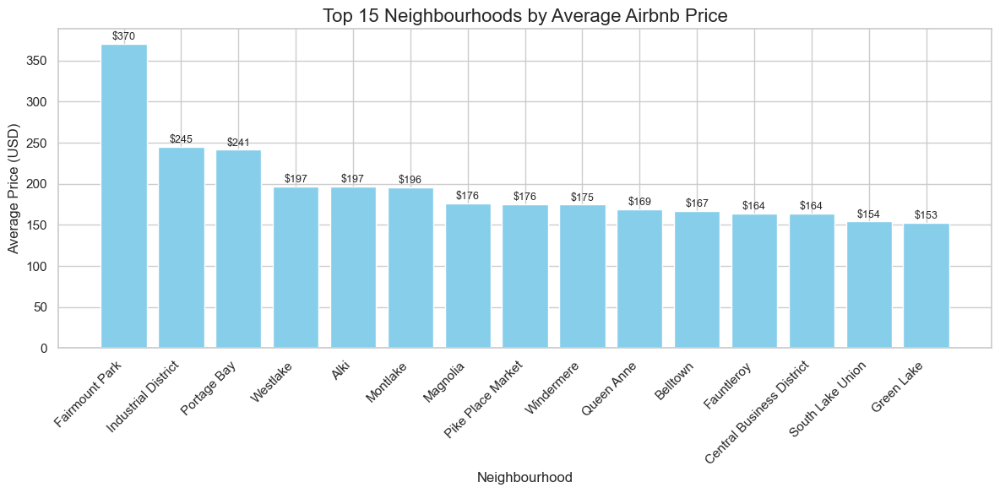

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\960699701.py:36: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




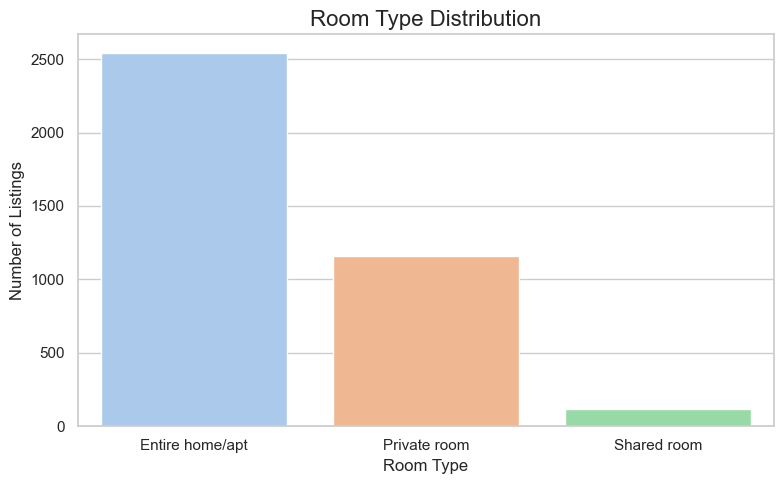

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\960699701.py:47: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




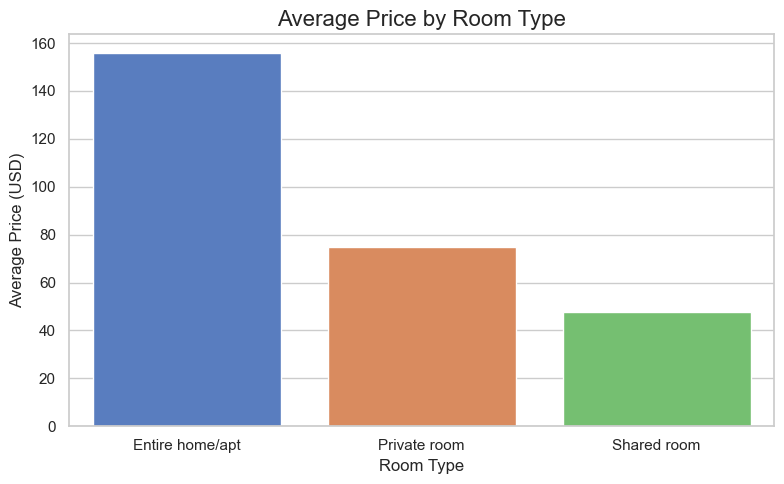

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\960699701.py:58: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




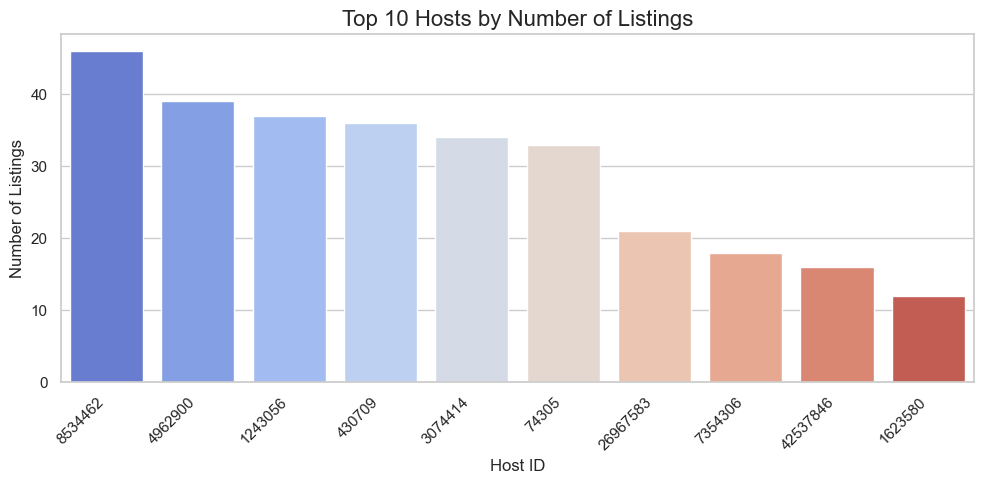

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\960699701.py:70: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




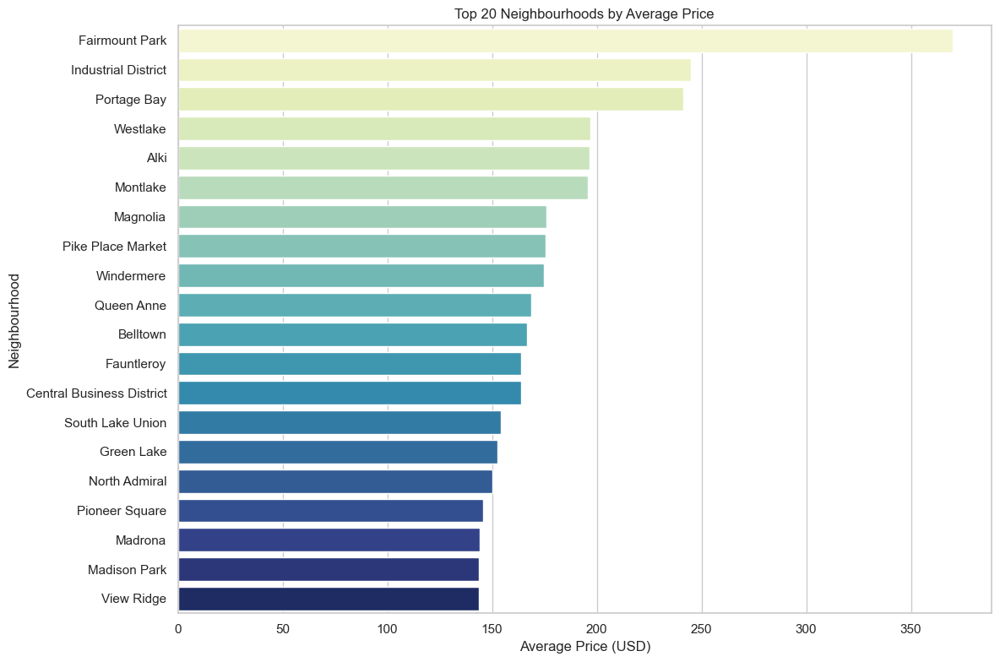

In [70]:
# =======================
# Airbnb Storytelling - Option 1
# =======================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Step 1: Load Data ---
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# --- Step 2: Clean Price Column ---
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)

# --- Step 3: Insight 1 - Top 15 Neighbourhoods by Avg Price ---
avg_price = df.groupby('neighbourhood')['price'].mean().round(2).sort_values(ascending=False)
top_n_price = avg_price.head(15)

plt.figure(figsize=(12, 6))
bars = plt.bar(top_n_price.index, top_n_price.values, color='skyblue')
plt.title("Top 15 Neighbourhoods by Average Airbnb Price", fontsize=16)
plt.xlabel("Neighbourhood", fontsize=12)
plt.ylabel("Average Price (USD)", fontsize=12)
plt.xticks(rotation=45, ha='right')

for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
             f"${bar.get_height():,.0f}", ha='center', fontsize=9)
plt.tight_layout()
plt.show()

# --- Step 4: Insight 2 - Room Type Distribution ---
room_type_counts = df['room_type'].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=room_type_counts.index, y=room_type_counts.values, palette='pastel')
plt.title("Room Type Distribution", fontsize=16)
plt.xlabel("Room Type", fontsize=12)
plt.ylabel("Number of Listings", fontsize=12)
plt.tight_layout()
plt.show()

# --- Step 5: Insight 3 - Average Price by Room Type ---
avg_price_room = df.groupby('room_type')['price'].mean().round(2)

plt.figure(figsize=(8, 5))
sns.barplot(x=avg_price_room.index, y=avg_price_room.values, palette='muted')
plt.title("Average Price by Room Type", fontsize=16)
plt.xlabel("Room Type", fontsize=12)
plt.ylabel("Average Price (USD)", fontsize=12)
plt.tight_layout()
plt.show()

# --- Step 6: Insight 4 - Top 10 Hosts by Number of Listings ---
host_counts = df['host_id'].value_counts().head(10)

plt.figure(figsize=(10, 5))
sns.barplot(x=host_counts.index.astype(str), y=host_counts.values, palette='coolwarm')
plt.title("Top 10 Hosts by Number of Listings", fontsize=16)
plt.xlabel("Host ID", fontsize=12)
plt.ylabel("Number of Listings", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Optional: Average price by neighbourhood only (sorted)
neigh_price = df.groupby('neighbourhood')['price'].mean().sort_values(ascending=False).head(20)

plt.figure(figsize=(12, 8))
sns.barplot(y=neigh_price.index, x=neigh_price.values, palette="YlGnBu")
plt.title("Top 20 Neighbourhoods by Average Price")
plt.xlabel("Average Price (USD)")
plt.ylabel("Neighbourhood")
plt.tight_layout()
plt.show()

In [74]:
import pandas as pd
from datetime import datetime

# Load data (if not loaded already)
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# 1. Clean 'price' column (remove $ and commas, convert to float)
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)

# 2. Create new feature: price per guest
df['price_per_guest'] = df['price'] / df['accommodates']

# 3. Create new feature: is available all year
df['available_all_year'] = df['availability_365'] == 365

# 4. Convert 'last_review' to datetime, create days_since_last_review
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')
today = pd.to_datetime('today')
df['days_since_last_review'] = (today - df['last_review']).dt.days

# 5. Handle missing values
# For example, fill missing 'days_since_last_review' with a high number (e.g., 999) assuming no recent review
df['days_since_last_review'].fillna(999, inplace=True)

# 6. Remove outliers in price — e.g., listings above 95th percentile price
price_95 = df['price'].quantile(0.95)
df = df[df['price'] <= price_95]

print(df[['price', 'price_per_guest', 'available_all_year', 'days_since_last_review']].head())

   price  price_per_guest  available_all_year  days_since_last_review
0   85.0        21.250000               False                  3509.0
1  150.0        37.500000               False                  3513.0
3  100.0        33.333333               False                   999.0
5  120.0        60.000000               False                  3605.0
6   80.0        40.000000               False                  3535.0


C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\1988238220.py:23: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [75]:
import pandas as pd

# Step 1: Load the dataset
df = pd.read_csv(r"D:\airbnb-project\data\listings.csv")

# Step 2: Clean price column
# Remove $ and commas, then convert to numeric
df['price'] = df['price'].astype(str).str.replace('$', '', regex=False).str.replace(',', '', regex=False)
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# Step 3: Remove rows with missing essential values
df = df.dropna(subset=['price', 'latitude', 'longitude'])

# Step 4: Filter out unrealistic prices (e.g. above 500)
df = df[df['price'] < 500]

# Step 5: Clean latitude and longitude to valid ranges
df = df[(df['latitude'].between(-90, 90)) & (df['longitude'].between(-180, 180))]

# Check cleaned data
print(df.head())
print(f"Total rows after cleaning: {len(df)}")

        id                           listing_url       scrape_id last_scraped  \
0   241032   https://www.airbnb.com/rooms/241032  20160104002432   2016-01-04   
1   953595   https://www.airbnb.com/rooms/953595  20160104002432   2016-01-04   
3  7421966  https://www.airbnb.com/rooms/7421966  20160104002432   2016-01-04   
4   278830   https://www.airbnb.com/rooms/278830  20160104002432   2016-01-04   
5  5956968  https://www.airbnb.com/rooms/5956968  20160104002432   2016-01-04   

                                 name  \
0        Stylish Queen Anne Apartment   
1  Bright & Airy Queen Anne Apartment   
3                  Queen Anne Chateau   
4      Charming craftsman 3 bdm house   
5     Private unit in a 1920s mansion   

                                             summary  \
0                                                NaN   
1  Chemically sensitive? We've removed the irrita...   
3  A charming apartment that sits atop Queen Anne...   
4  Cozy family craftman house in beautiful

C:\Users\rawat\AppData\Local\Temp\ipykernel_2532\2443663614.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




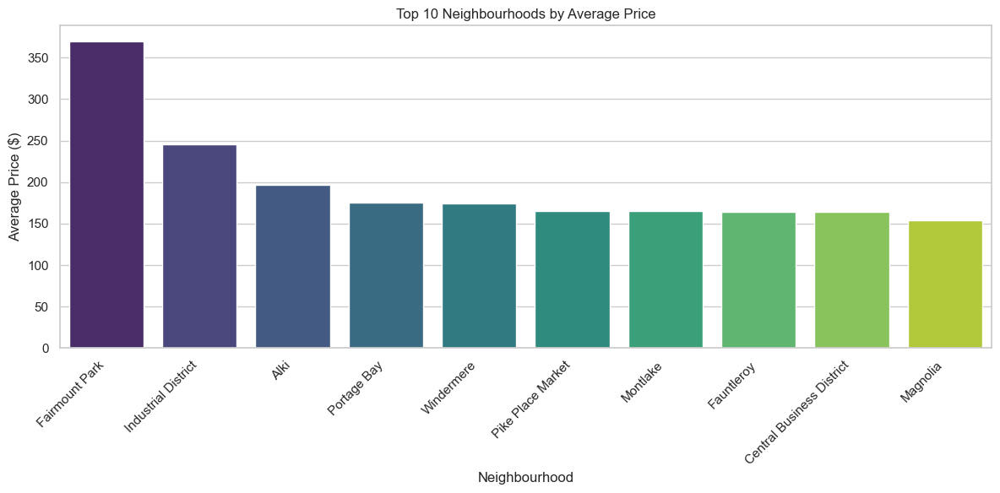

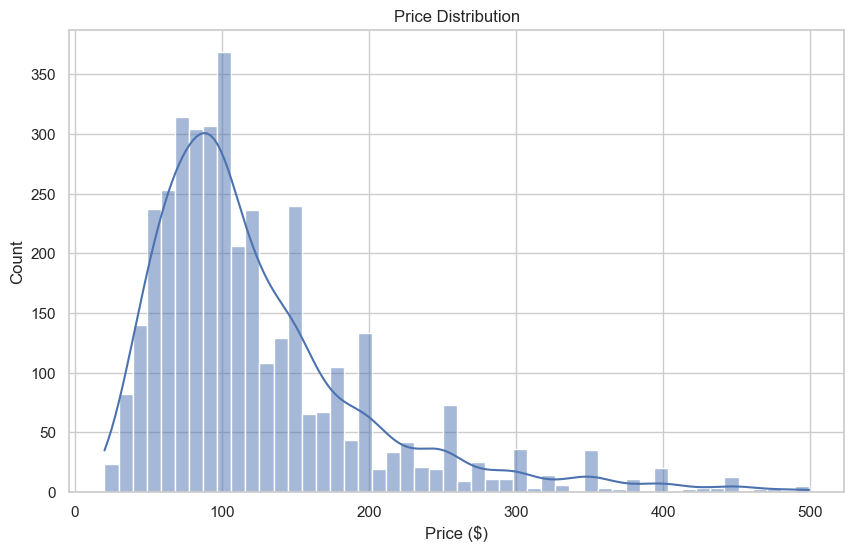

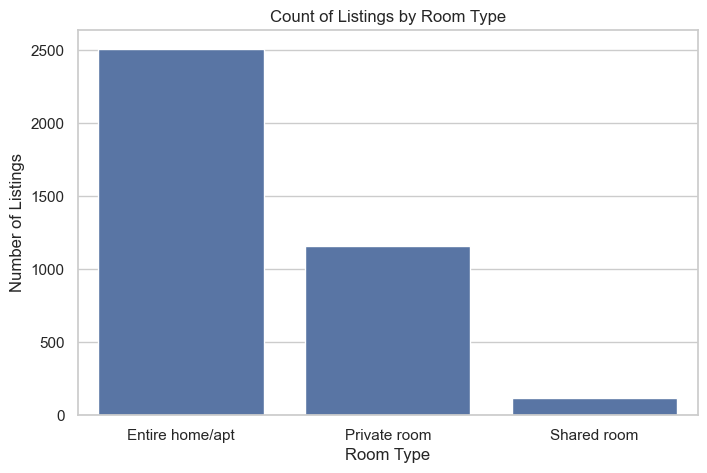

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 2.1: Top 10 neighborhoods by average price
top10_neighbourhoods = df.groupby('neighbourhood')['price'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(12,6))
sns.barplot(x=top10_neighbourhoods.index, y=top10_neighbourhoods.values, palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Neighbourhoods by Average Price')
plt.ylabel('Average Price ($)')
plt.xlabel('Neighbourhood')
plt.tight_layout()
plt.show()

# Step 2.2: Distribution of prices
plt.figure(figsize=(10,6))
sns.histplot(df['price'], bins=50, kde=True)
plt.title('Price Distribution')
plt.xlabel('Price ($)')
plt.ylabel('Count')
plt.show()

# Step 2.3: Count of listings by room type
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='room_type', order=df['room_type'].value_counts().index)
plt.title('Count of Listings by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Number of Listings')
plt.show()

In [77]:
import folium

# Create a base map centered around the average latitude and longitude of listings
map_center = [df['latitude'].mean(), df['longitude'].mean()]
airbnb_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for the first 200 listings (to avoid performance issues)
for idx, row in df.head(200).iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"{row['name']} - ${row['price']}"
    ).add_to(airbnb_map)

# Save map to HTML
airbnb_map.save(r"D:\airbnb-project\airbnb_map.html")

Top 10 listings by number of reviews:
listing_id
3861673                1543
25002                  1119
12929985                983
1122523901292097869     965
11398085                961
7462250                 951
19699462                908
3543247                 900
365550                  896
3022564                 885
Name: count, dtype: int64


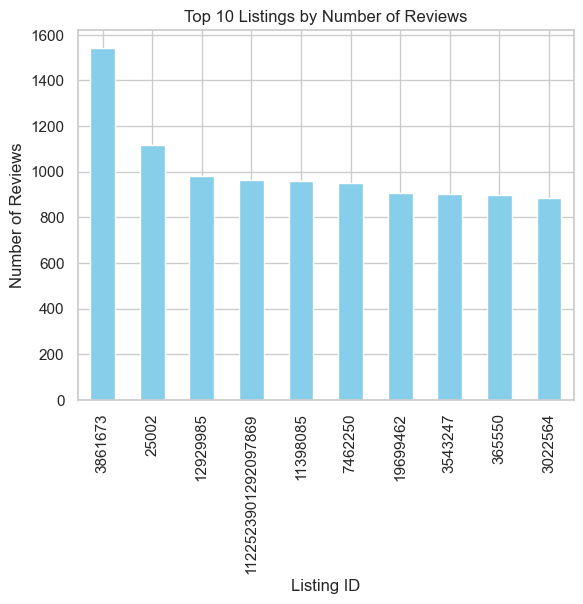

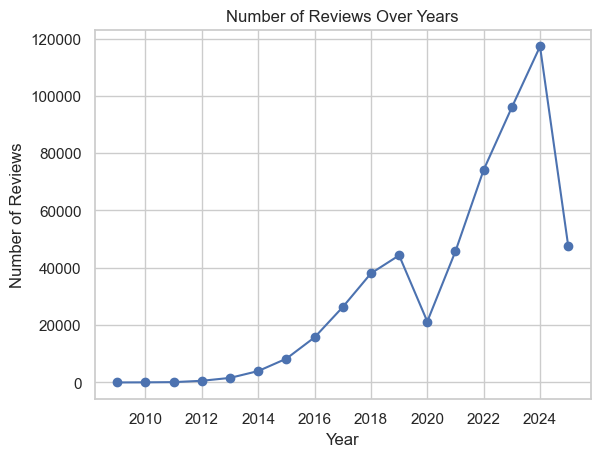

In [82]:
import pandas as pd
import matplotlib.pyplot as plt

# Load reviews dataset
reviews = pd.read_csv(r"D:\airbnb-project\data\reviews.csv")

# Count number of reviews per listing_id
reviews_count = reviews['listing_id'].value_counts().head(10)
print("Top 10 listings by number of reviews:")
print(reviews_count)

# Plot top 10 listings with most reviews
reviews_count.plot(kind='bar', color='skyblue')
plt.title("Top 10 Listings by Number of Reviews")
plt.xlabel("Listing ID")
plt.ylabel("Number of Reviews")
plt.show()

# Reviews over time (all listings)
reviews['date'] = pd.to_datetime(reviews['date'])
reviews_per_year = reviews.groupby(reviews['date'].dt.year).size()

reviews_per_year.plot(kind='line', marker='o')
plt.title("Number of Reviews Over Years")
plt.xlabel("Year")
plt.ylabel("Number of Reviews")
plt.show()

Top 10 listings by number of reviews:
listing_id
3861673                1543
25002                  1119
12929985                983
1122523901292097869     965
11398085                961
7462250                 951
19699462                908
3543247                 900
365550                  896
3022564                 885
Name: count, dtype: int64


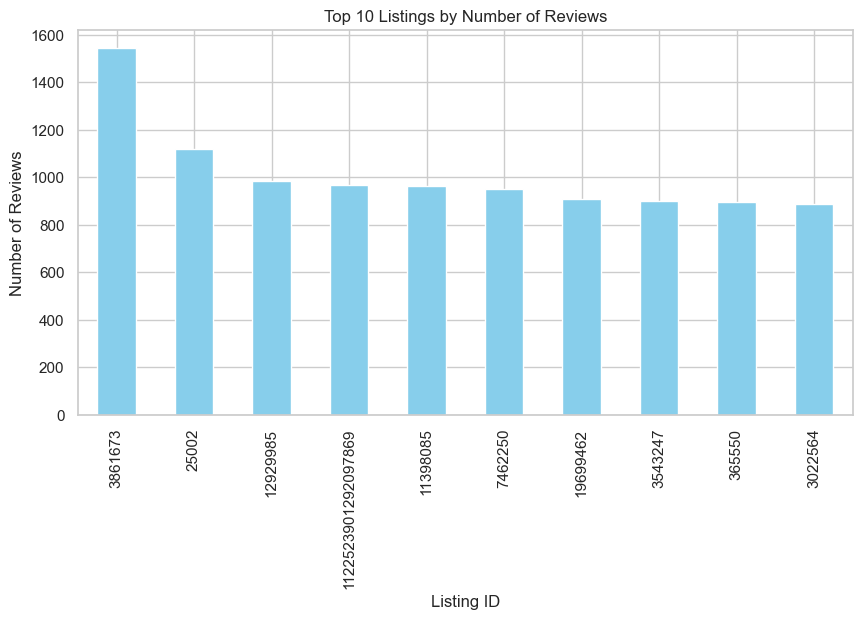

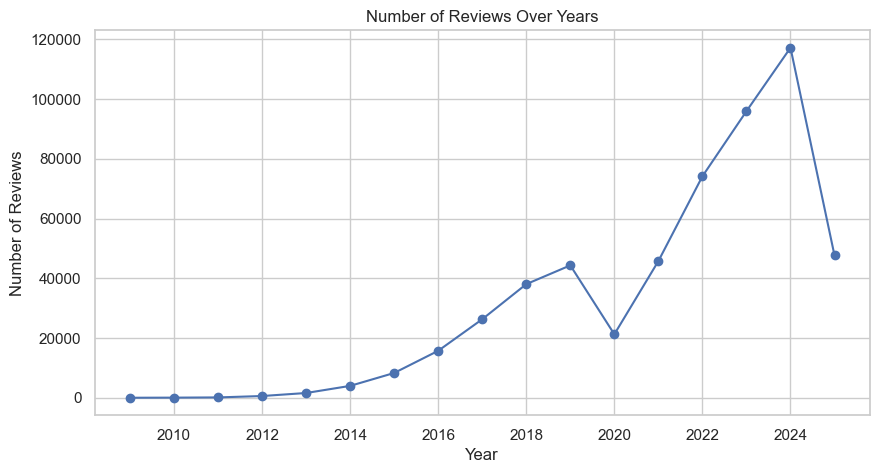

In [83]:
import pandas as pd
import matplotlib.pyplot as plt

# Load reviews dataset
reviews = pd.read_csv(r"D:\airbnb-project\data\reviews.csv")

# Convert 'date' column to datetime
reviews['date'] = pd.to_datetime(reviews['date'])

# 1. Top 10 listings by number of reviews
top_listings = reviews['listing_id'].value_counts().head(10)
print("Top 10 listings by number of reviews:")
print(top_listings)

# Plot bar chart for top 10 listings by number of reviews
plt.figure(figsize=(10,5))
top_listings.plot(kind='bar', color='skyblue')
plt.title('Top 10 Listings by Number of Reviews')
plt.xlabel('Listing ID')
plt.ylabel('Number of Reviews')
plt.show()

# 2. Number of reviews over years (all listings)
reviews_per_year = reviews.groupby(reviews['date'].dt.year).size()

plt.figure(figsize=(10,5))
reviews_per_year.plot(kind='line', marker='o')
plt.title('Number of Reviews Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Reviews')
plt.grid(True)
plt.show()